In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
from matplotlib.collections import PatchCollection
from PIL import Image, ImageFont, ImageDraw
import subprocess
from pathlib import Path
import SimpleITK as sitk
from skimage import measure
import scipy

%pylab inline

infile = '/home/johannes/Desktop/billfish/SFA3.original.4v0.hdf5'
imgdir = '/home/johannes/Desktop/billfish/plots/'

tempdir = imgdir + 'temp/'

valid_dataset_identifiers = ['data', 'original']
captions = ['a', 'b', 'c', 'd']


def load_file(start=None, end=None, scale=1, input_file=infile):
    with h5py.File(input_file, 'r') as file:
        for identifier in valid_dataset_identifiers:
            if identifier in file.keys():
                data = file[identifier]
                break
        
        image = data[start:end:scale, ::scale, ::scale][::, ::-1, ::]
    return image

Populating the interactive namespace from numpy and matplotlib


In [2]:
def sitk_show(img, title=None, margin=0.05, dpi=40 ):
    nda = sitk.GetarFromImage(img)
    spacing = img.GetSpacing()
    figsize = (1 + margin) * nda.shape[0] / dpi, (1 + margin) * nda.shape[1] / dpi
    extent = (0, nda.shape[1]*spacing[1], nda.shape[0]*spacing[0], 0)
    fig = plt.figure(figsize=figsize, dpi=dpi)
    ax = fig.add_axes([margin, margin, 1 - 2*margin, 1 - 2*margin])

    plt.set_cmap("gray")
    ax.imshow(nda,extent=extent,interpolation=None)
    
    if title:
        plt.title(title)
    
    plt.show()

thresholds for image a : 0-255
thresholds for image b : 0-18
thresholds for image c : 18-75
thresholds for image d : 75-255


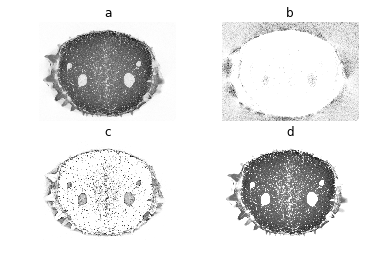

In [95]:
ar = load_file(start=1200, end=1225)
    
f, axes = plt.subplots(2, 2, sharex='col', sharey='row')

axes = np.ravel(axes)
ranges = [(0, 255), (0, 18), (18, 75), (75, 255)]
# ranges = [(0, 20), (20, 35), (35, 45), (45, 60)]
# ranges = [(0, 20), (0, 35), (0, 25), (0, 30)]

for i in range(4):
    start, end = ranges[i]
    subplot = axes[i]
    
    func = lambda e: e if start <= e < end else 0
    
    subplot.imshow(np.mean(np.vectorize(func)(ar), axis=0), cmap="Greys")
    subplot.set_title(captions[i])
    print(f'thresholds for image {captions[i]} : {start}-{end}')

    subplot.axis('off')

plt.savefig("comparative_plot.png", bbox_inches='tight', dpi=1200)

plt.show()

(3479, 1104, 1524)
(232, 1104, 1524)
current: 0
24076
current: 1
24018
current: 2
23796
current: 3
23860
current: 4
24088
current: 5
24364
current: 6
24426
current: 7
24184


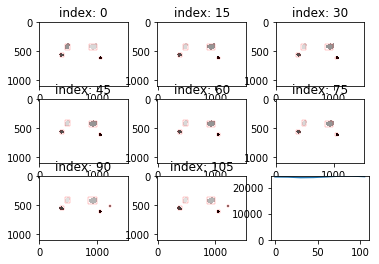

In [4]:
interval = 15

with h5py.File('/home/johannes/Desktop/billfish/plots/growth_mainchannel.hdf5', 'r') as file:
    shape_orig = file['data'].shape
    ar = file['data'][::interval]
    
print(ar.shape)
f, axes = plt.subplots(3, 3)  # , sharex='col', sharey='row')

axes = np.ravel(axes)
measure_points = []

for i in range(8):
    subplot = axes[i]
    temp_ar = ar[i]
    labels = measure.label(temp_ar)
    subplot.imshow(labels, cmap="Greys")
    subplot.set_title(f"index: {i*interval}")
    print(f"current: {i}")
    
    current_areas = []
    
    for j in range(1, np.max(labels)+1):
        indices = np.where(labels==j)
        current_areas.append(np.count_nonzero(indices))
        
        starty = indices[0][0]
        endy = indices[0][-1]
        
    
        indices = np.where(np.transpose(labels, (1, 0))==j)
        startx = indices[0][0]
        endx = indices[0][-1]
        
        
        rect = patches.Rectangle((startx, starty), endx-startx, endy-starty, linewidth=.21, edgecolor='r', facecolor='none' )
        subplot.add_patch(rect)
        subplot.
    max_area = np.max(current_areas)
    print(max_area)
    measure_points.append((i*interval, max_area))


axes[8].plot(*zip(*measure_points))
axes[8].set_ylim(ymin=0)
plt.savefig('bla.png', dpi =1200)
plt.show()


In [2]:
img = mpimg.imread('/home/johannes/Desktop/billfish/slices/44.png')
fig, ax = plt.subplots()
imgplot = ax.imshow(img, cmap='Greys')
boxes = [
patches.Rectangle((982, 425), 81, 116),  # A
patches.Rectangle((468, 461), 75, 97),   # B
patches.Rectangle((321, 649), 41, 38),   # C
patches.Rectangle((1148, 651), 35, 38)   # D   
]
collection = PatchCollection(boxes, linewidth=1, edgecolor='r', facecolor='none'  )
ax.add_collection(collection)
plt.savefig('roi.png', dpi =2400)
plt.show()

In [8]:
start = 43
end = start + 25
with h5py.File('/home/johannes/Desktop/billfish/SFA3.original.4v0.hdf5', 'r') as file:
    print(file['original'].shape)
    data = file['original']
    ar = [data[start:end, 425:541, 982:1063],
            data[start:end, 461:558, 486:543],
            data[start:end, 649:687, 321:362],
            data[start:end, 651:689, 1148:1183]]
    full_data = data[start:end]


ar = np.concatenate([i.flatten() for i in ar])
ar.shape



(4979, 1104, 1524)


(445325,)

[36 38 32 ... 49 48 46]
26


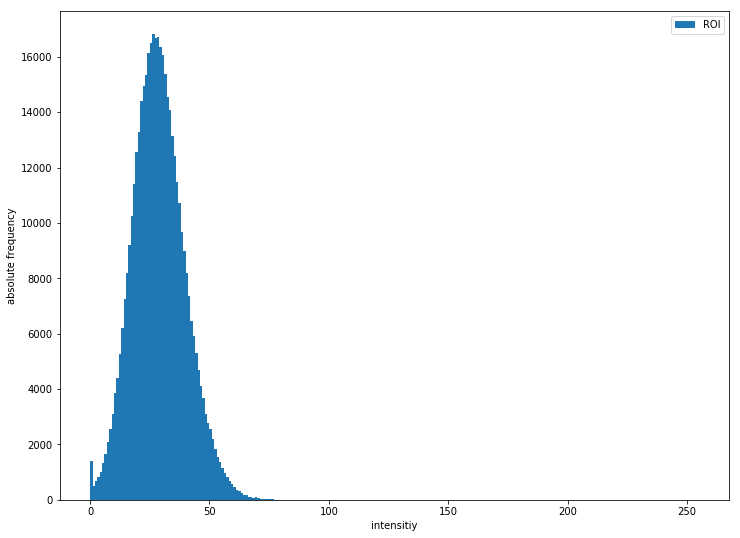

In [17]:
print(ar)
plt.hist(ar, bins=255, range=(0,255), density=True)
uniques = np.unique(ar, return_counts=True)
print(np.argmax(uniques[1]))

plt.xlabel("intensitiy")
plt.ylabel('relative frequency')
# Get current size
fig_size = plt.rcParams["figure.figsize"]
 
# Set figure width to 12 and height to 9
fig_size[0] = 12
fig_size[1] = 9
plt.rcParams["figure.figsize"] = fig_size
plt.savefig('roi_histogram.png')
plt.show()

(4979, 1104, 1524)


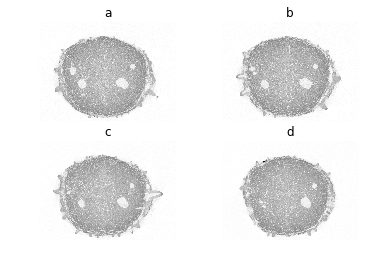

In [6]:

wh= 2
num_plots= wh**2
f, axes = plt.subplots(wh, wh, sharex='col', sharey='row')
axes = axes.ravel()
f.figsize = 15,15
indices = [2750, 2850, 2950, 3050]
font = ImageFont.truetype(font='usr/share/fonts/TTF/LiberationMono-Bold.ttf', size=35)

with h5py.File('/home/johannes/Desktop/billfish/SFA3.original.4v0.hdf5', 'r') as file:
    print(file['original'].shape)
    data = file['original']
    images = [data[i][::-1, ::] for i in indices]

for i in range(len(indices)):
    current_index = indices[i]
    axes[i].imshow(images[i], cmap='Greys', vmin=0, vmax=255)
    axes[i].autoscale(False)
    axes[i].set_title(captions[i])
    axes[i].axis('off')
# plt.tight_layout()
plt.savefig('comparative_plot_scaled.png', dpi=1024)
plt.show()

(4979, 1524) (4979, 1104)
(525.8715836015581, 763.5427015135587)
(532.4027736404859, 777.2674552345017)
(538.8298863100568, 771.6965292431948)
(553.7349472783415, 779.7232814701562)
(559.2496151260868, 798.5248826405602)
(562.9775663971122, 793.5526841171251)
(578.9341668734021, 799.571506246409)
(581.4876746334141, 793.456986089567)
(587.9934905705228, 791.1208579485601)
(588.6050586990718, 801.1454064486912)
(595.6261067129698, 798.9517078195356)
(596.3138312689506, 790.6168765439883)
(595.7111205134267, 791.4094562658452)
(598.7070343589379, 784.1175812446288)
(599.1620373037055, 789.6137244611699)
(599.434047531391, 781.6735210129509)
(599.880660545205, 767.4188173219867)
(594.768183020365, 770.7930581936797)
(596.3635934955828, 764.5776509595374)
(597.3544480078201, 763.8305922547113)
(590.9745163734199, 769.3372873878288)
(588.6861563881885, 763.961683362925)
(580.5672673318707, 767.8705430455745)
(573.9595169251638, 769.1639267564856)
(564.7043637599762, 770.9347968585154)


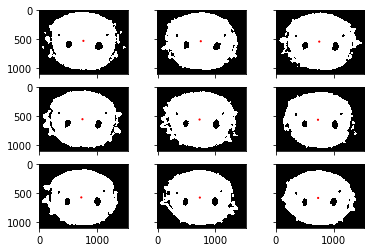

In [3]:
from scipy import ndimage

interval = 200

wh= 3
num_plots= wh**2
f, axes = plt.subplots(wh, wh, sharex='col', sharey='row')
axes = axes.ravel()
f.figsize = 15,15


with h5py.File('/home/johannes/Desktop/billfish/SFA3.original.4v0.hdf5', 'r') as file:
    shape_orig = file['original'].shape
    crosssection_y = file['original'][:,552,:]
    crosssection_z = file['original'][:,:,762]
    
    data = file['original'][::interval]

print(crosssection_y.shape, crosssection_z.shape)
centers = []

for i in range(data.shape[0]):
    image = data[i]
    image = sitk.GetImageFromArray(image)
    image = sitk.Mean(image, [15, 15])
    image = sitk.OtsuThreshold(image)
    image = sitk.GetArrayFromImage(image)
    center = ndimage.measurements.center_of_mass(image)
    centers.append(center)

    if i < 9:
        axes[i].imshow(image[::-1], cmap='Greys')
        circle = patches.Circle((shape_orig[2]-center[1], center[0]), 10, color='red')
        axes[i].add_patch(circle)

        



[9.26911317e-03 5.57046114e+02]


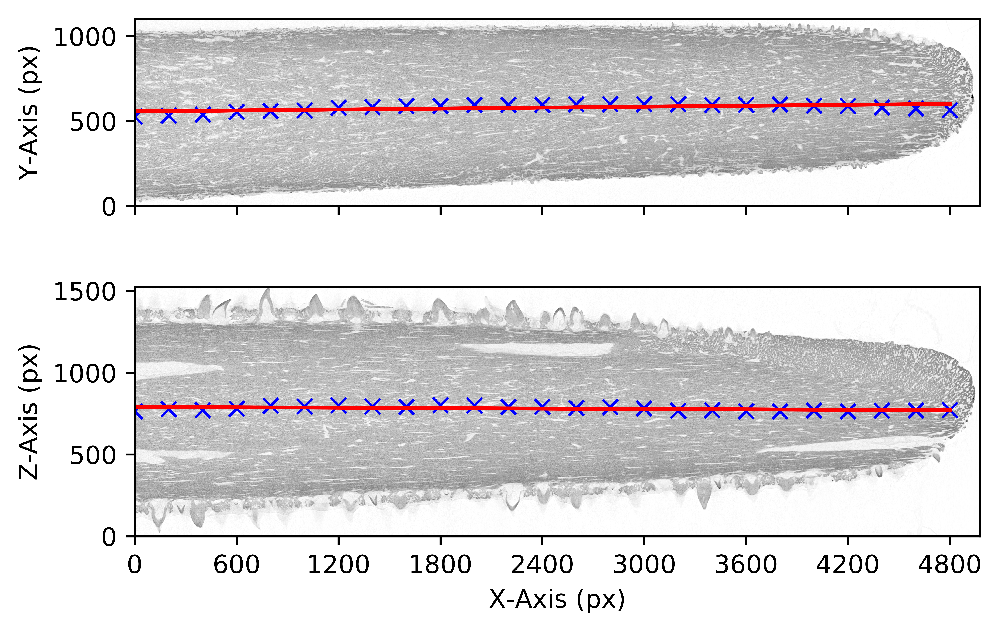

In [5]:
y_data = [i[0] for i in centers]
z_data = [i[1] for i in centers]

f, axes = plt.subplots(2, sharex=True, dpi=1200)
axes = axes.ravel()
f.figsize = 20,20

x_intervals=list(range(0, shape_orig[0], interval))
axes[0].imshow(np.swapaxes(crosssection_z, 0, 1)[::-1], cmap='Greys')
axes[0].plot(x_intervals, y_data, 'bx')
axes[0].set_ylim(0, shape_orig[1])
axes[0].set_xticks(x_intervals[::3])
y_regression = np.polyfit(x_intervals, y_data, 1)
axes[0].plot([0, x_intervals[-1]], [y_regression[1], x_intervals[-1]*y_regression[0]+y_regression[1]], 'r')
axes[0].set_ylabel('Y-Axis (px)')
print(y_regression)


axes[1].imshow(np.swapaxes(crosssection_y, 0, 1)[::-1], cmap='Greys')
axes[1].plot(x_intervals, z_data, 'bx')
axes[1].set_ylim(0, shape_orig[2])
axes[1].set_xticks(x_intervals[::3])
axes[1].set_aspect('auto')

z_regression = np.polyfit(x_intervals, z_data, 1)

axes[1].plot([0, x_intervals[-1]], [z_regression[1], x_intervals[-1]*z_regression[0]+z_regression[1]], 'r')
axes[1].set_ylabel('Z-Axis (px)')
axes[1].set_xlabel('X-Axis (px)')

plt.savefig('centres_of_mass.png')

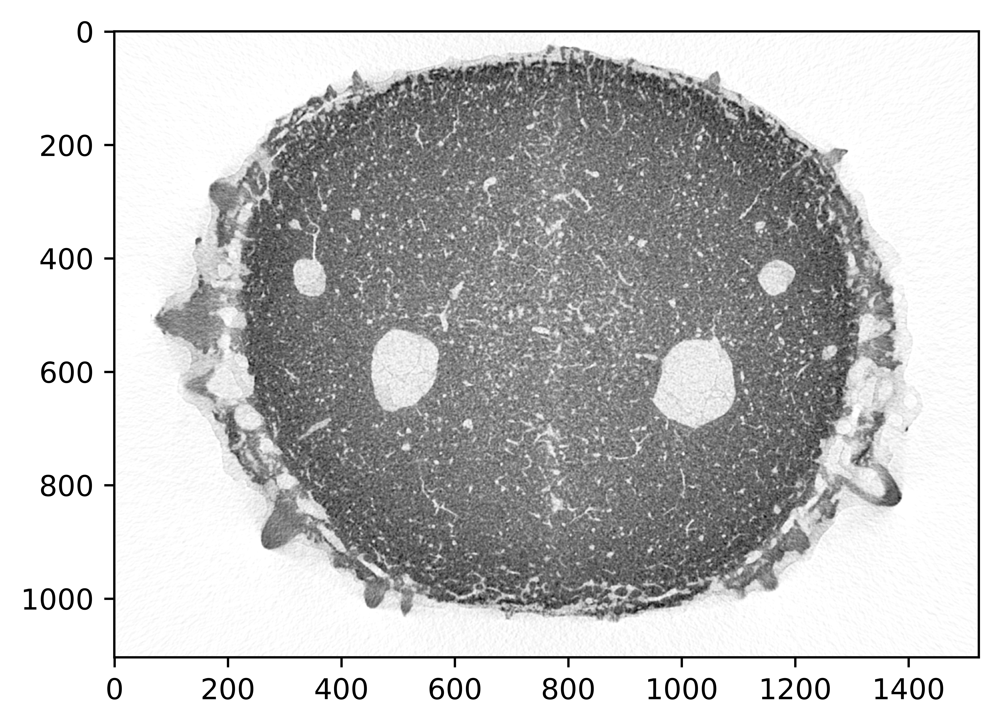

In [121]:
with h5py.File(infile) as file:
    img = file['original'][43][::-1]
    
plt.figure(dpi=1200)

plt.imshow(img, cmap='Greys')
plt.savefig('slice.png')

total number of voxels: 67135380
(array([ 26, 106, 172, 204, 239]), {})
global maximum at index 0: 0.25512482390060204
setting y axis limit to: 0.046464367968126495


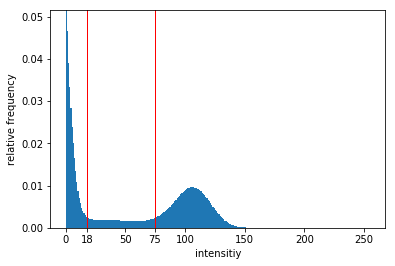

In [27]:
# displays the histogram of the entire dataset

ar = load_file(scale=5)
shape = ar.shape
num_voxels = shape[0] * shape[1] * shape[2]
print(f'total number of voxels: {num_voxels}')

ar=ar.flatten()
plt.hist(ar, bins=255, range=(0,255), density=True)
uniques = np.unique(ar, return_counts=True)

max_index = np.argmax(uniques[1])

peaks = scipy.signal.find_peaks(uniques[1], distance=30)
print(f"peaks: {peaks}")

global_max = uniques[1][max_index] / num_voxels
print(f'global maximum at index {max_index}: {global_max}')

y_limit = uniques[1][1] / num_voxels
print(f'setting y axis limit to: {ymax}')

plt.ylim(0, y_limit+0.005)
plt.xlabel("intensitiy")
plt.ylabel('relative frequency')

thresholds = (18, 75)
plt.plot([thresholds[0], thresholds[0]], [0, 0.25], 'r-', lw=1)
plt.plot([thresholds[1], thresholds[1]], [0, 0.25], 'r-', lw=1)

ticks = sorted(list(range(0, 255, 50)) + list(thresholds))
plt.xticks(ticks)

plt.savefig('histogram.png')
plt.show()

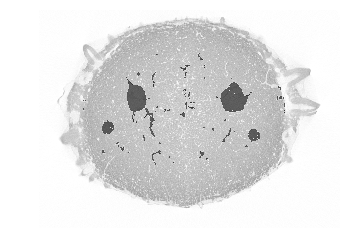

In [83]:
start, end = 1630, 1640

ar = np.mean(load_file(start, end), axis=0)

ar2 = np.mean(load_file(start, end, input_file='/home/johannes/Desktop/billfish/plots/growth_caudal.hdf5'), axis=0)

f,ax = plt.subplots()
ax.axis('off')
ax.imshow(ar, cmap='Greys')
ar2 = np.vectorize(lambda e: 1 if e > 0 else 0)(ar2)
ax.imshow(ar2, cmap='Greys', alpha=0.6)
plt.savefig(f'threshold_slice.png', dpi=960)
plt.show()

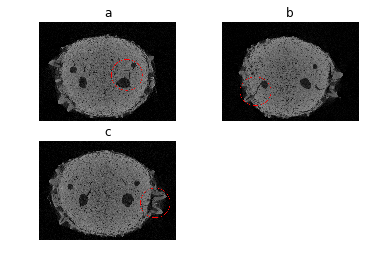

In [50]:
img_list = ['/home/johannes/Desktop/B_D_connection.png', '/home/johannes/Desktop/A_Tooth_connection.png', '/home/johannes/Desktop/t_t_connection_1631.png', '']
f, ax = plt.subplots(2, 2)
ax = ax.ravel()
for i in range(3):
    image = mpimg.imread(img_list[i])
    ax[i].imshow(image)
    ax[i].axis('off')
    ax[i].set_title(captions[i])

ax[3].axis('off')
plt.savefig('channel_connections.png', dpi=860)
plt.show()


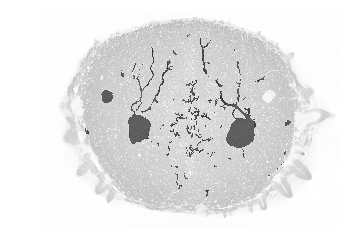

In [25]:
img = load_file(150, 190, input_file='/home/johannes/Desktop/billfish/plots/growth_caudal.hdf5')
x, y, z = img.shape
out_array = np.zeros((y, z))
for i in range(y):
    for j in range(z):
        if np.any(img[:,i,j]):
            out_array[i,j] = 1
f,ax = plt.subplots()

background = np.mean(load_file(150, 160), axis=0)

ax.axis('off')

ax.imshow(background, cmap='Greys')
ax.imshow(out_array, cmap='Greys', alpha=0.6)
plt.savefig('region_growth.png', dpi=1024)
plt.show()